In [1]:
#setup
import re
import numpy as np
import pandas as pd
from DecisionTree import Tree
from sklearn.model_selection import train_test_split
from sklearn import metrics

## Zadanie 6.
Zbiór danych Bank Marketing (http://archive.ics.uci.edu/ml/datasets/Bank+Marketing) zawiera informacje o klientach banku i ich zainteresowaniu lokatami bankowymi. Zapoznaj się z tym zbiorem danych i na jego podstawie stwórz drzewo decyzyjne pozwalające przewidywać czy klient banku będzie zainteresowany lokatami czy nie na podstawie zgromadzonych o nim informacji.

In [2]:
#load df
df = pd.read_csv('data/bank-full.csv', sep=';')
df = df.rename({'y':'target'}, axis=1)

In [3]:
train_df, test_df = train_test_split(df, test_size=0.3333)
tree_gini = Tree(train_df, criterion='gini')
tree_entropy = Tree(train_df, criterion='infogain_ratio')

In [4]:
pred_gini, pred_entropy = [], []
for i in range(len(test_df)):
    pred_gini.append(tree_gini.classify(test_df.iloc[i]))
    pred_entropy.append(tree_entropy.classify(test_df.iloc[i]))
    
conf_gini = metrics.confusion_matrix(np.array(pred_gini), test_df['target'])
conf_entropy = metrics.confusion_matrix(np.array(pred_entropy), test_df['target'])

print('Confussion matrix for gini', conf_gini)
print('Confussion matrix for entropy', conf_entropy)

Confussion matrix for gini [[12338   933]
 [  953   845]]
Confussion matrix for entropy [[12394   914]
 [  897   864]]


In [5]:
tree_gini.draw()

In [6]:
tree_entropy.draw()

### Let's try to prune it

In [7]:
tree_gini.prune_with_confidence_interval()
tree_entropy.prune_with_confidence_interval()

In [9]:
pred_gini, pred_entropy = [], []
for i in range(len(test_df)):
    pred_gini.append(tree_gini.classify(test_df.iloc[i]))
    pred_entropy.append(tree_entropy.classify(test_df.iloc[i]))
    
conf_gini = metrics.confusion_matrix(np.array(pred_gini), test_df['target'])
conf_entrnopy = metrics.confusion_matrix(np.array(pred_entropy), test_df['target'])

print('Confussion matrix for prunned gini', conf_gini)
print('Confussion matrix for prunned entropy', conf_entropy)

Confussion matrix for prunned gini [[13291  1778]
 [    0     0]]
Confussion matrix for prunned entropy [[13291  1778]
 [    0     0]]


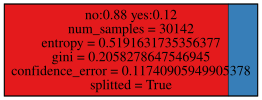

In [10]:
tree_gini.draw()

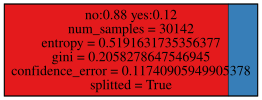

In [11]:
tree_entropy.draw()